In [1]:
import os
os.environ["PYTHONWARNINGS"] = "ignore"

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import gseapy as gp
import decoupler as dc
import matplotlib.pyplot as plt
import seaborn as sns
import time

from scipy.stats import pearsonr

In [4]:
sc.set_figure_params(dpi=100, facecolor=None, color_map="seismic", frameon=False, vector_friendly=True, transparent=True)
sc.settings._vector_friendly = False

In [5]:
# set working directory
project_dir = "/Users/cenkcelik/Cenk_scoring/"
working_dir = project_dir + ""
os.chdir(working_dir)

# set figure directory
figure_dir = working_dir + "figures/"

# processed data directory
processed_data = working_dir + "processed_data/"

In [6]:
# import a local package
import sys
sys.path.append("/Users/cenkcelik/Documents/GitHub/EnrichMap/")
import enrichmap as em

In [7]:
adata = sq.datasets.visium_hne_adata()

In [8]:
adata.layers["counts"] = adata.raw.X.copy()

In [9]:
adata.X = adata.layers["counts"].copy()

In [10]:
sc.pp.filter_genes(adata, min_cells=20)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.layers["log1p_norm"] = adata.X.copy()

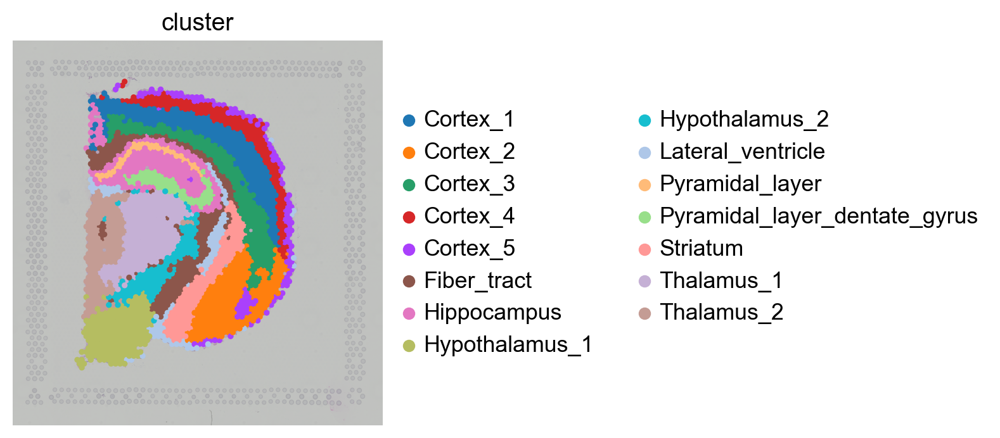

In [11]:
sq.pl.spatial_scatter(adata, color="cluster", size=2, img_alpha=0.5, save="brain_clusters.pdf")

In [12]:
sc.tl.rank_genes_groups(adata, groupby="cluster", method="wilcoxon", layer="log1p_norm", use_raw=False)
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.5, min_fold_change=2, max_out_group_fraction=0.5)

In [13]:
gene_set_10 = adata.uns["rank_genes_groups"]["names"]["Pyramidal_layer"][:10].tolist()

### EnrichMap

In [14]:
t1 = time.time()
em.tl.score(
    adata,
    gene_set=gene_set_10,
    smoothing=True,
    correct_spatial_covariates=True,
    batch_key=None
)
t2=time.time()
print(t2-t1)

Scoring signatures: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]

1.596782922744751


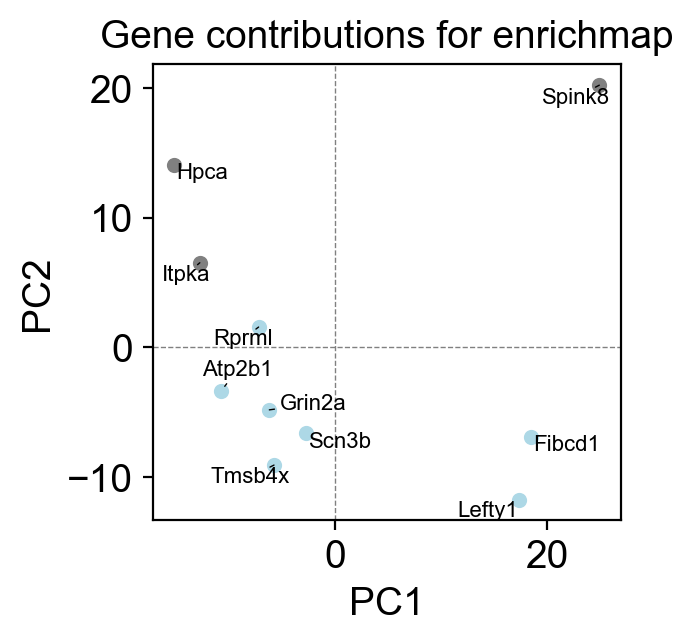

In [15]:
em.pl.gene_contributions_pca(
    adata,
    score_key="enrichmap",
    top_n_genes=10,
    highlight_genes=["Hpca", "Itpka", "Cck", "Spink8"],
    figsize=(3, 3),
    save="brain_gene_contributions_pca.pdf",
)

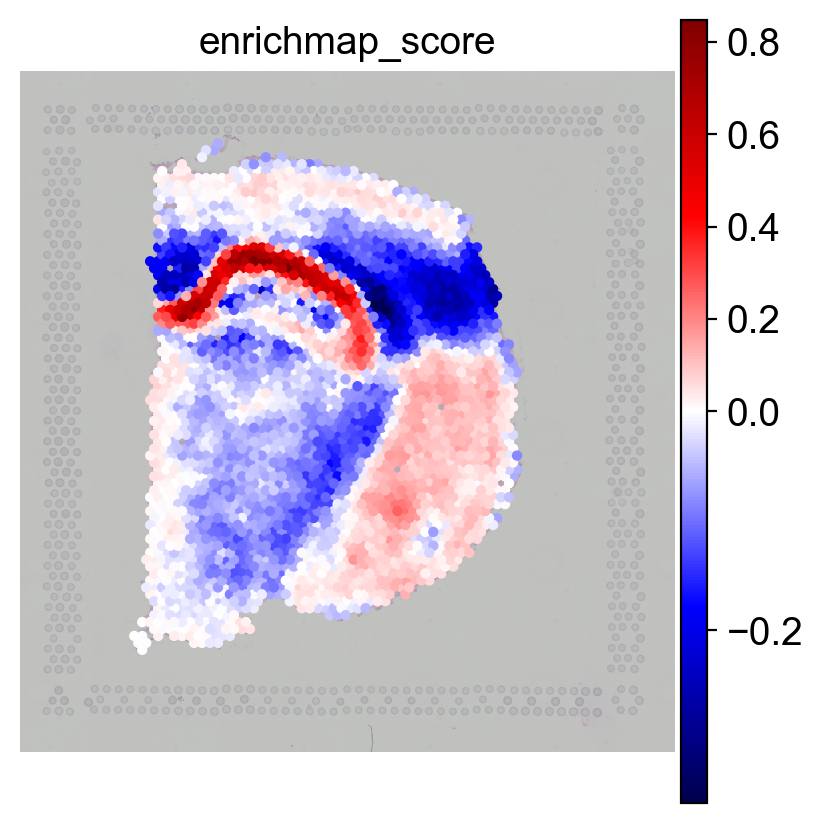

In [16]:
sq.pl.spatial_scatter(adata, color=["enrichmap_score"], img_alpha=0.5, size=2, vcenter=0, save="brain_enrichmap_score.pdf")

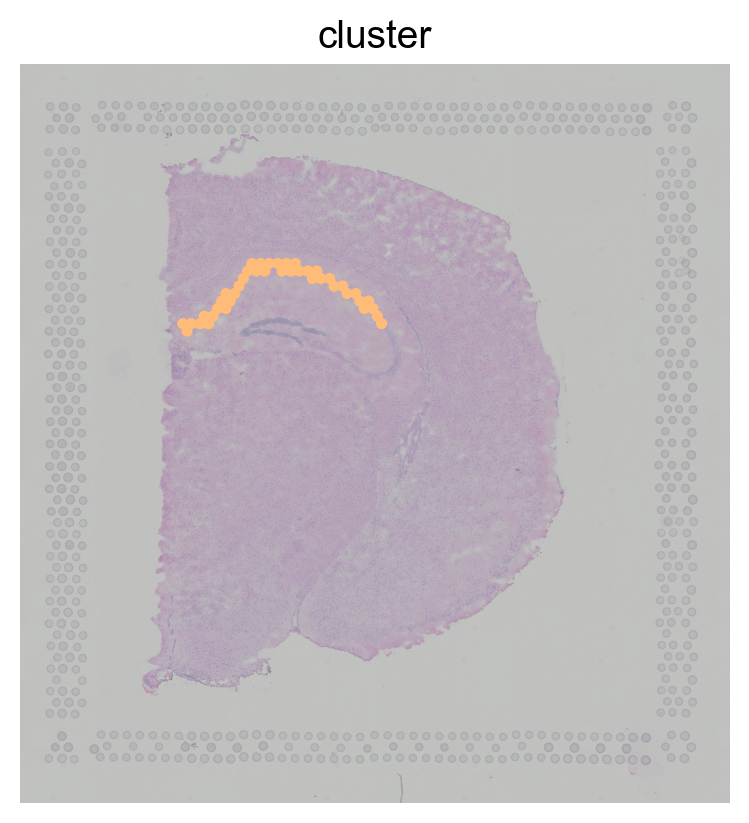

In [17]:
sq.pl.spatial_scatter(adata, color=["cluster"], img_alpha=0.5, size=2, groups="Pyramidal_layer", legend_loc=None, save="brain_enrichmap_score_cluster_pyramidal_layer.pdf")

### AUCell

In [18]:
# convert the signature dict to a long format
signatures_dict_10 = {
    "Pyramidal_layer": gene_set_10
}

signatures_10 = pd.DataFrame(
    [(key, gene) for key, genes in signatures_dict_10.items() for gene in genes],
    columns=["geneset", "genesymbol"]
)

t1 = time.time()
dc.run_aucell(
    adata,
    net=signatures_10,
    source="geneset",
    target="genesymbol",
    seed=0,
    verbose=True,
    use_raw=False
)
t2=time.time()
print(t2-t1)

acts = dc.get_acts(adata, obsm_key="aucell_estimate")

adata.obs["aucell_score"] = acts.obsm["aucell_estimate"]["Pyramidal_layer"]

Running aucell on mat with 2688 samples and 15883 targets for 1 sources.


100%|██████████| 2688/2688 [00:03<00:00, 841.65it/s]

3.3637948036193848


## `score_genes()`/`AddModuleScore()`

In [19]:
t1 = time.time()
sc.tl.score_genes(adata, gene_set_10, score_name="scanpy_score", use_raw=False)
t2=time.time()
print(t2-t1)

0.11357378959655762


## ssGSEA

In [20]:
# If adata.X is sparse, convert to dense first
X_dense = adata.X.toarray() if not isinstance(adata.X, np.ndarray) else adata.X

# Create DataFrame using var names as columns and obs names as index
gene_expr = pd.DataFrame(X_dense.T, index=adata.var_names, columns=adata.obs_names)

In [21]:
gene_expr.index = gene_expr.index.str.upper()
signatures_dict_10 = {k: [g.upper() for g in v] for k, v in signatures_dict_10.items()}

In [22]:
t1 = time.time()
ssgsea = gp.ssgsea(
    data=gene_expr,
    gene_sets=signatures_dict_10,
    outdir=None,
    sample_norm_method="rank",
    no_plot=True,
    min_size=5
)
t2=time.time()
print(t2-t1)

9.375809907913208


In [23]:
nes = ssgsea.res2d.pivot(index="Term", columns="Name", values="NES")
adata.obs["ssgsea_score"] = nes.loc["Pyramidal_layer"].T.astype(float).reindex(adata.obs_names)

### GSVA

In [24]:
t1 = time.time()
gsva = gp.gsva(
    data=gene_expr,
    gene_sets=signatures_dict_10,
    outdir=None,
    min_size=5
)
t2=time.time()
print(t2-t1)

85.88493418693542


In [25]:
es = gsva.res2d.pivot(index="Term", columns="Name", values="ES")
adata.obs["gsva_score"] = es.loc["Pyramidal_layer"].T.astype(float).reindex(adata.obs_names)

### Z score

In [26]:
gene_set = signatures_dict_10["Pyramidal_layer"]
t1 = time.time()
z_score = gene_expr.loc[gene_set].sum(axis=0) / np.sqrt(len(gene_set))
t2=time.time()
print(t2-t1)
adata.obs["z_score"] = z_score

0.008149862289428711


In [27]:
methods = ["enrichmap_score", "aucell_score", "z_score", "scanpy_score", "ssgsea_score", "gsva_score"]

Computing Moran's I for enrichmap_score...
Computing Moran's I for aucell_score...
Computing Moran's I for z_score...
Computing Moran's I for scanpy_score...
Computing Moran's I for ssgsea_score...
Computing Moran's I for gsva_score...


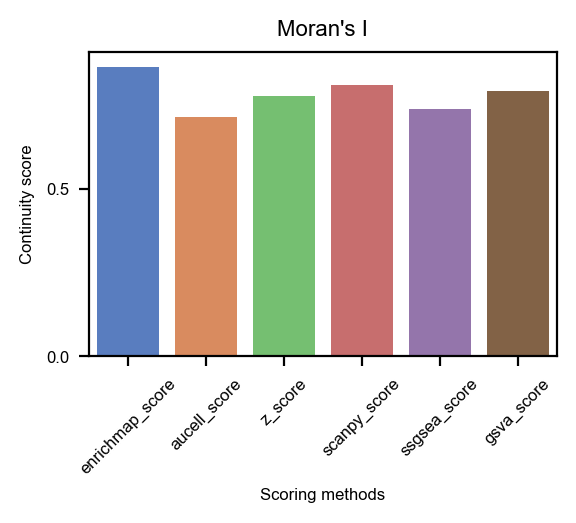

In [28]:
em.pl.spatial_metrics(adata, score_keys=methods, metric="Moran's I", figsize=(3, 2), save="brain_enrichmap_score_moransI.pdf")

Computing Geary's C for enrichmap_score...
Computing Geary's C for aucell_score...
Computing Geary's C for z_score...
Computing Geary's C for scanpy_score...
Computing Geary's C for ssgsea_score...
Computing Geary's C for gsva_score...


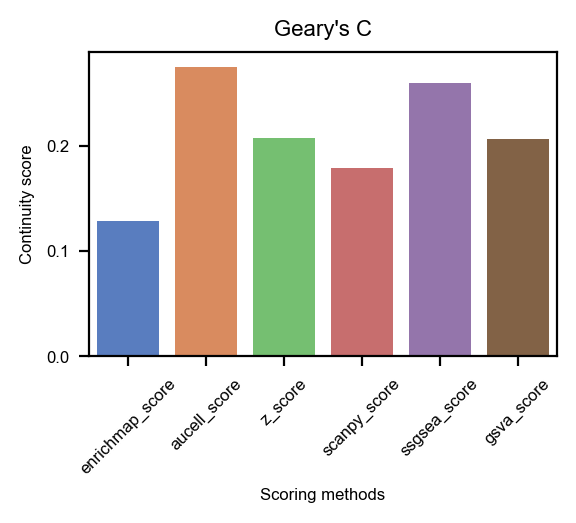

In [29]:
em.pl.spatial_metrics(adata, score_keys=methods, metric="Geary's C", figsize=(3, 2), save="brain_enrichmap_score_gearysC.pdf")

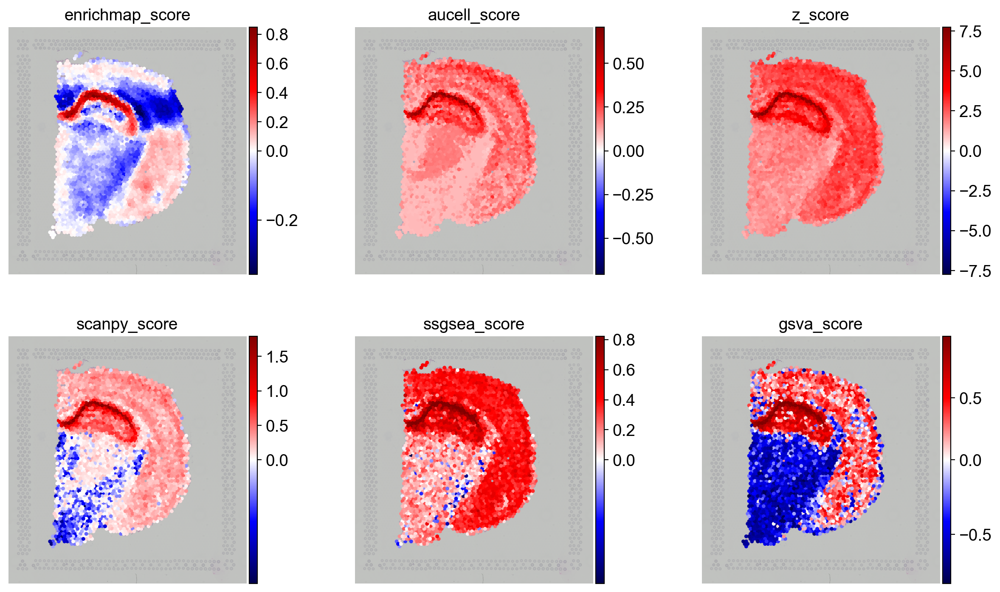

In [30]:
sq.pl.spatial_scatter(
    adata,
    color=methods,
    img_alpha=0.5,
    size=2,
    ncols=3,
    vcenter=0,
    save="brain_enrichmap_score_all.pdf",
)

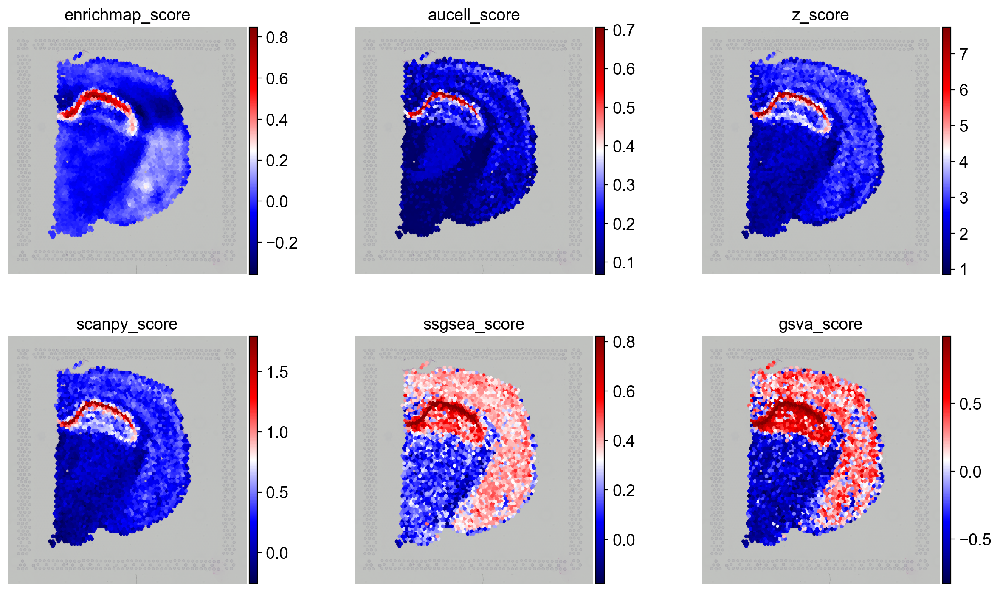

In [31]:
sq.pl.spatial_scatter(
    adata,
    color=methods,
    img_alpha=0.5,
    size=2,
    ncols=3,
    save="brain_enrichmap_score_all_not_scaled.pdf",
)

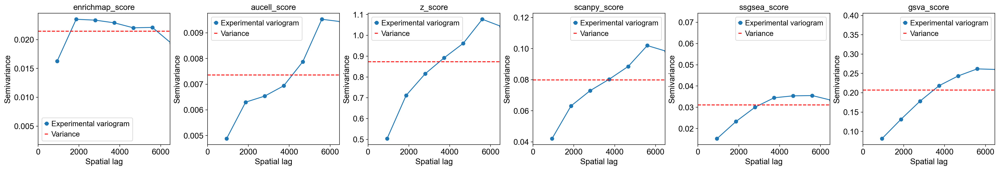

In [32]:
em.pl.variogram(
    adata,
    score_keys=methods,
    save="brain_enrichmap_score_variogram.pdf",
)

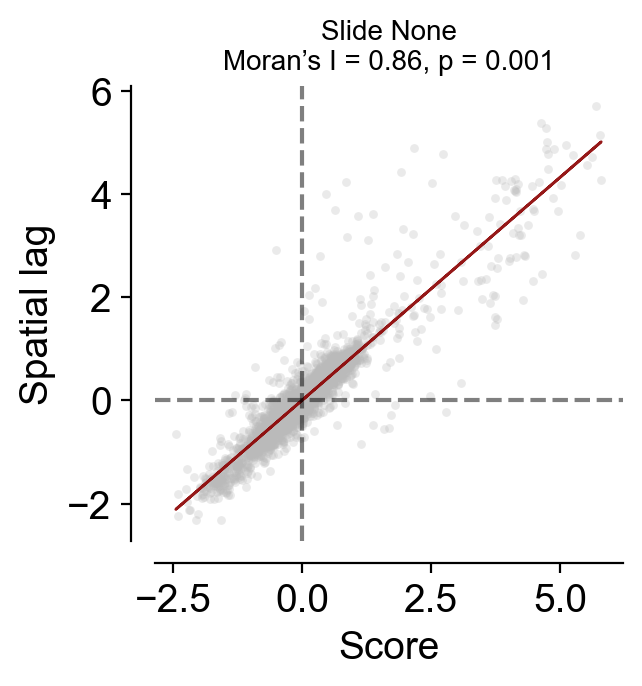

In [33]:
em.pl.morans_correlogram(
    adata,
    score_key="enrichmap_score",
    save="brain_enrichmap_score_morans_correlogram.pdf",
)

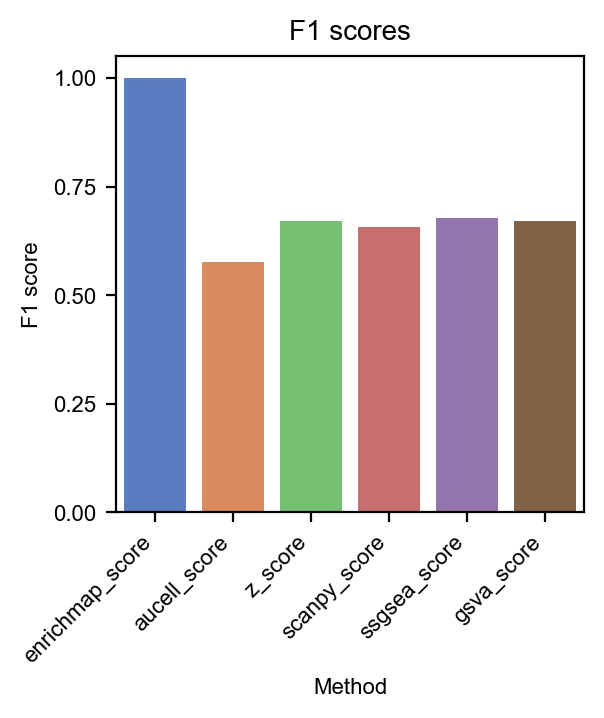

In [34]:
signature_name = "enrichmap"
binary_labels = em.tl.generate_binary_labels(adata, signature_name)
f1_scores = em.tl.compute_f1_scores(adata, methods, binary_labels, save="brain_enrichmap_score_f1_scores.pdf")

## Gene set sensitivity

In [35]:
gene_set_2 = adata.uns["rank_genes_groups"]["names"]["Pyramidal_layer"][:2].tolist()
gene_set_5 = adata.uns["rank_genes_groups"]["names"]["Pyramidal_layer"][:5].tolist()
gene_set_10 = adata.uns["rank_genes_groups"]["names"]["Pyramidal_layer"][:10].tolist()
gene_set_20 = adata.uns["rank_genes_groups"]["names"]["Pyramidal_layer"][:20].tolist()
gene_set_50 = adata.uns["rank_genes_groups"]["names"]["Pyramidal_layer"][:50].tolist()
gene_set_100 = adata.uns["rank_genes_groups"]["names"]["Pyramidal_layer"][:100].tolist()
gene_set_200 = adata.uns["rank_genes_groups"]["names"]["Pyramidal_layer"][:200].tolist()
gene_set_500 = adata.uns["rank_genes_groups"]["names"]["Pyramidal_layer"][:500].tolist()

In [36]:
# generate a dict
gene_set_sensitivity_dict = {
    "N_genes=2": gene_set_2,
    "N_genes=5": gene_set_5,
    "N_genes=10": gene_set_10,
    "N_genes=20": gene_set_20,
    "N_genes=50": gene_set_50,
    "N_genes=100": gene_set_100,
    "N_genes=200": gene_set_200,
    "N_genes=500": gene_set_500
}

In [37]:
em.tl.score(
    adata,
    gene_set=gene_set_sensitivity_dict,
    smoothing=True,
    correct_spatial_covariates=True,
    batch_key=None
)

Scoring signatures: 100%|██████████| 8/8 [00:42<00:00,  5.27s/it]


In [38]:
score_keys = [
    "N_genes=2_score",
    "N_genes=5_score",
    "N_genes=10_score",
    "N_genes=20_score",
    "N_genes=50_score",
    "N_genes=100_score",
    "N_genes=200_score",
    "N_genes=500_score"
]

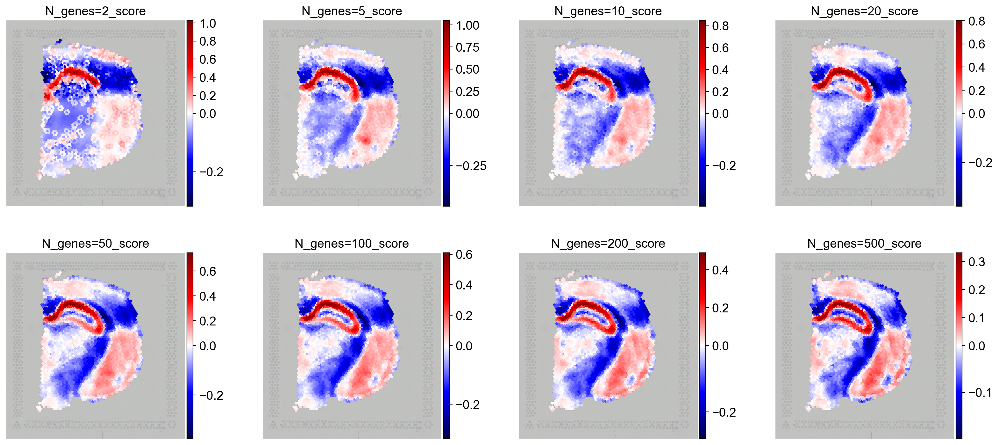

In [39]:
em.pl.spatial_enrichmap(
    adata,
    score_key=score_keys,
    ncols=4,
    save="brain_enrichmap_score_sensitivity.pdf",
)

Computing Moran's I for N_genes=2_score...
Computing Moran's I for N_genes=5_score...
Computing Moran's I for N_genes=10_score...
Computing Moran's I for N_genes=20_score...
Computing Moran's I for N_genes=50_score...
Computing Moran's I for N_genes=100_score...
Computing Moran's I for N_genes=200_score...
Computing Moran's I for N_genes=500_score...


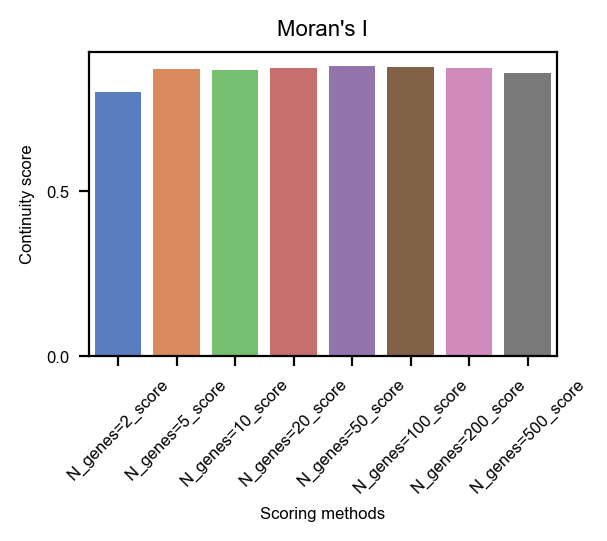

In [40]:
em.pl.spatial_metrics(adata, score_keys, metric="Moran's I", figsize=(3,2), save="brain_enrichmap_score_sensitivity_moransI.pdf")

Computing Geary's C for N_genes=2_score...
Computing Geary's C for N_genes=5_score...
Computing Geary's C for N_genes=10_score...
Computing Geary's C for N_genes=20_score...
Computing Geary's C for N_genes=50_score...
Computing Geary's C for N_genes=100_score...
Computing Geary's C for N_genes=200_score...
Computing Geary's C for N_genes=500_score...


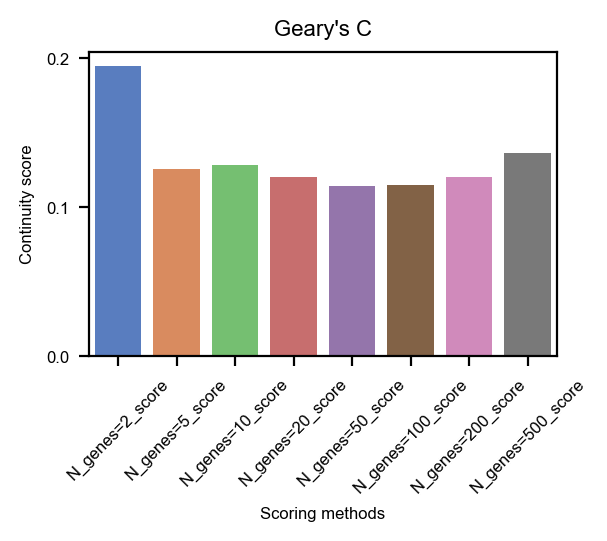

In [41]:
em.pl.spatial_metrics(adata, score_keys, metric="Geary's C", figsize=(3,2), save="brain_enrichmap_score_sensitivity_gearysC.pdf")

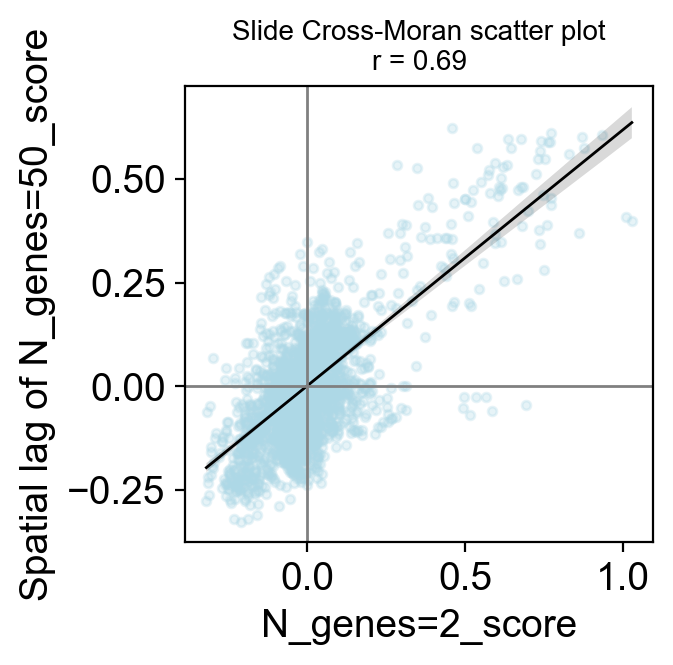

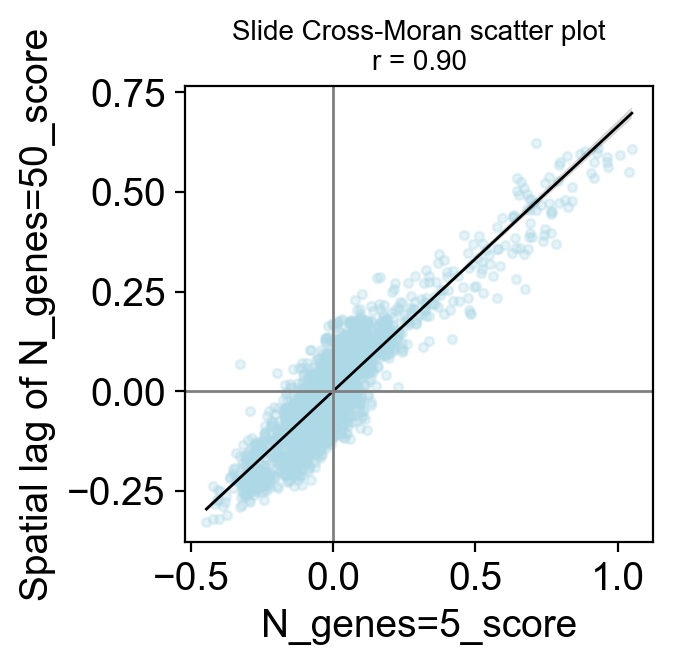

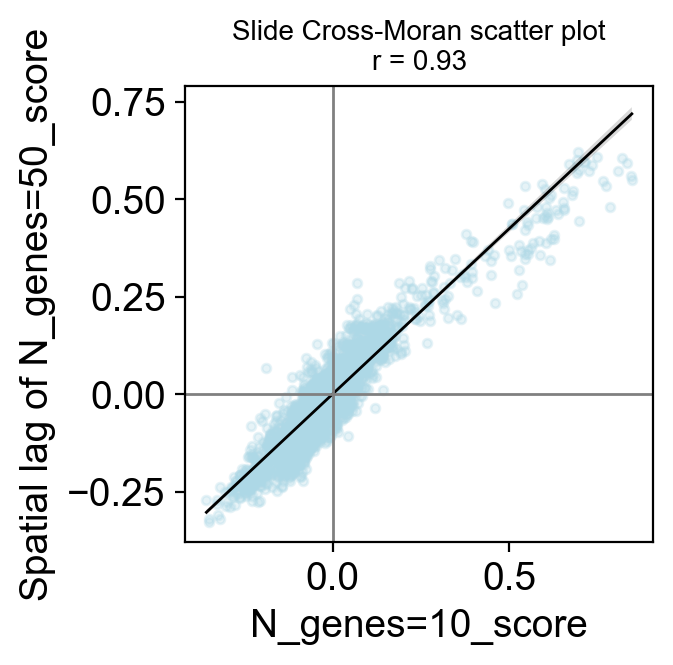

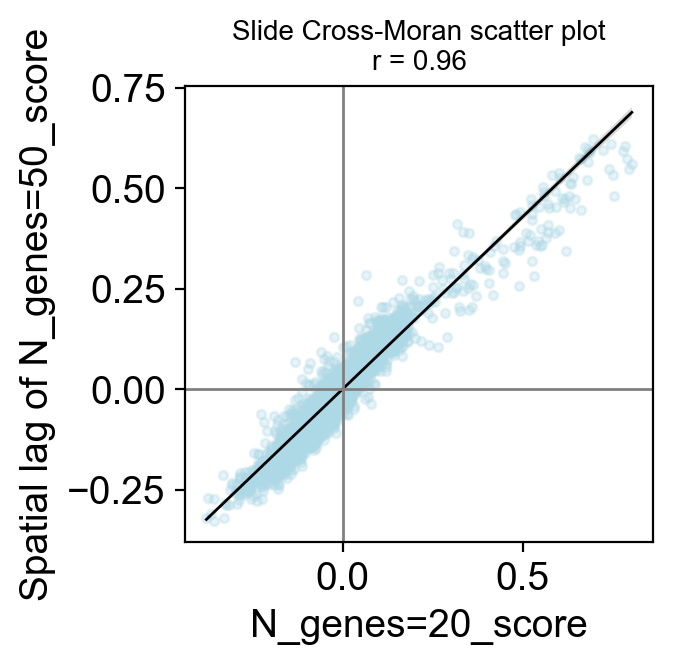

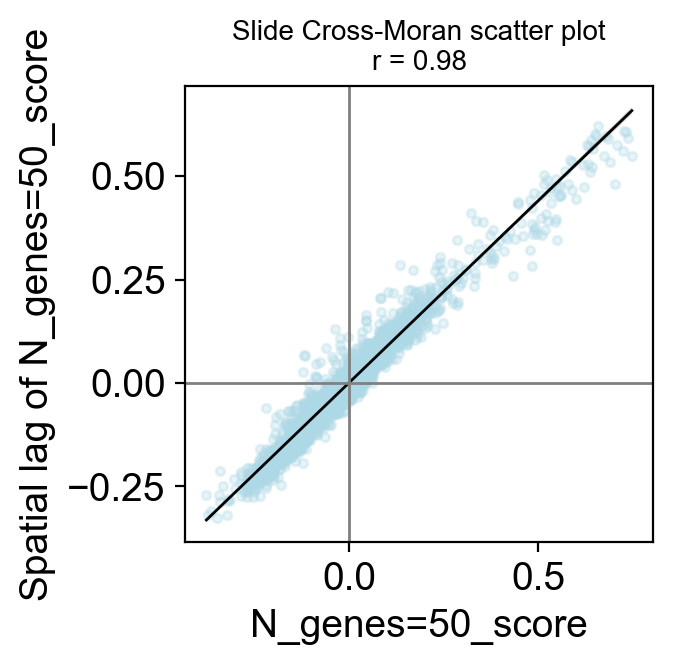

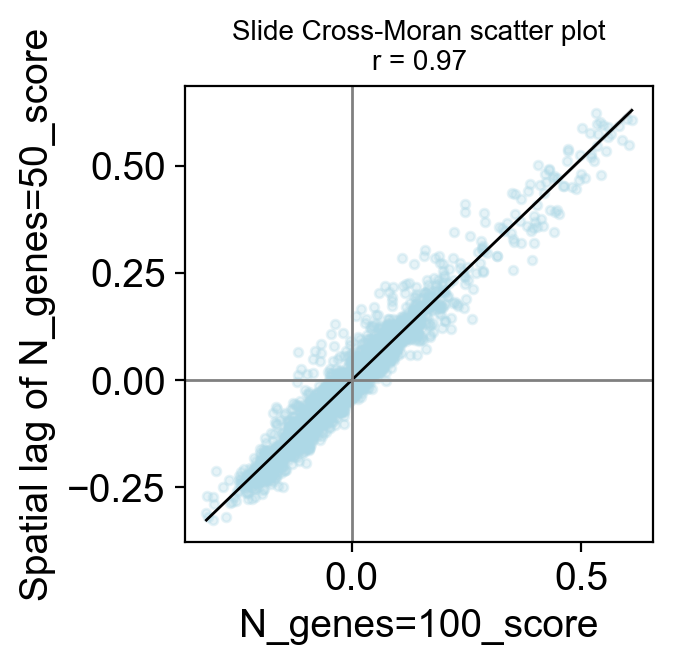

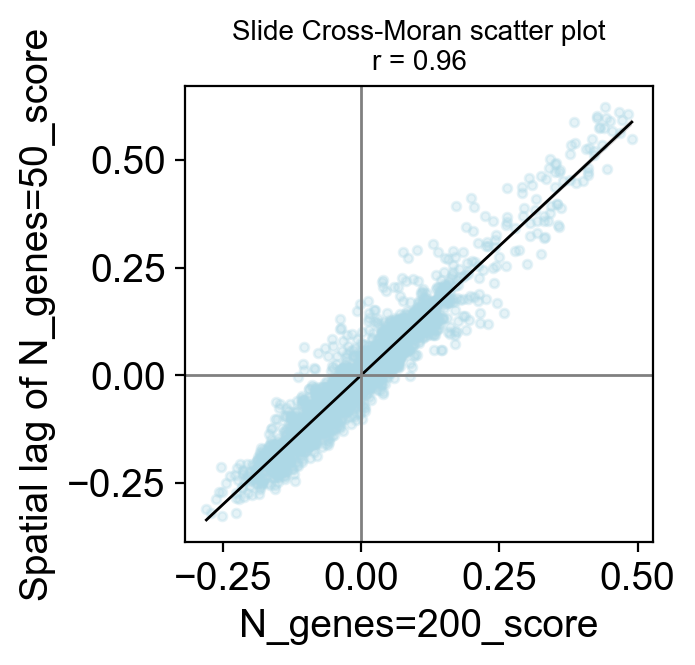

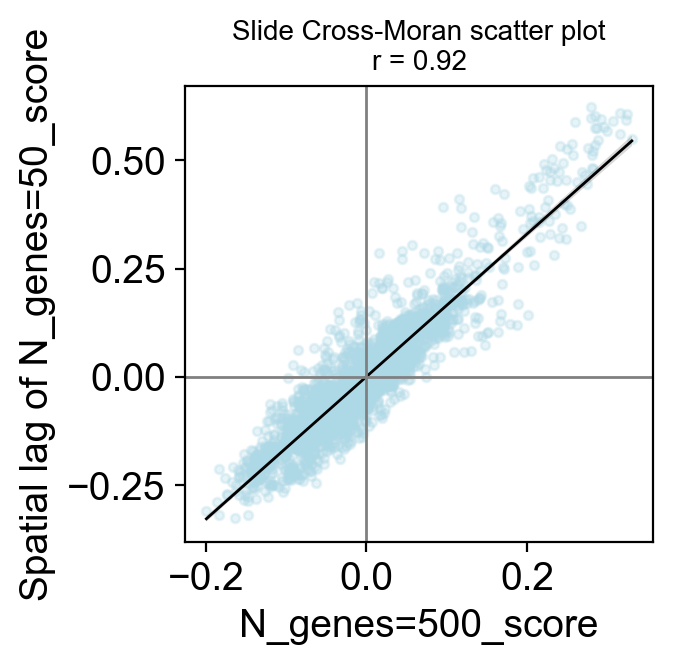

In [74]:
for score in score_keys:
    em.pl.cross_moran_scatter(
        adata,
        score_x=score,
        score_y="N_genes=50_score",
        batch_key=None,
        save=f"{score}_50_cross_moran_scatter.pdf",
    )

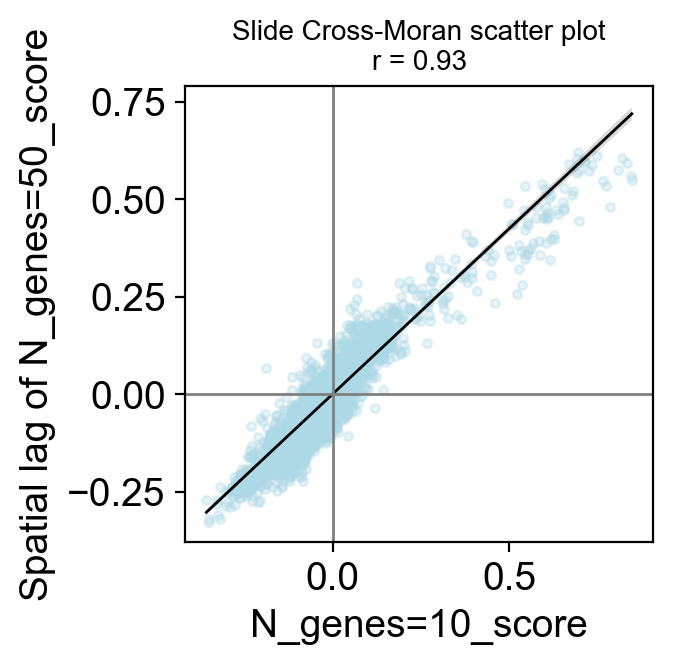

In [71]:
em.pl.cross_moran_scatter(
    adata,
    score_x="N_genes=10_score",
    score_y="N_genes=50_score",
    batch_key=None,
    save="N_genes_10_50_cross_moran_scatter.pdf",
)


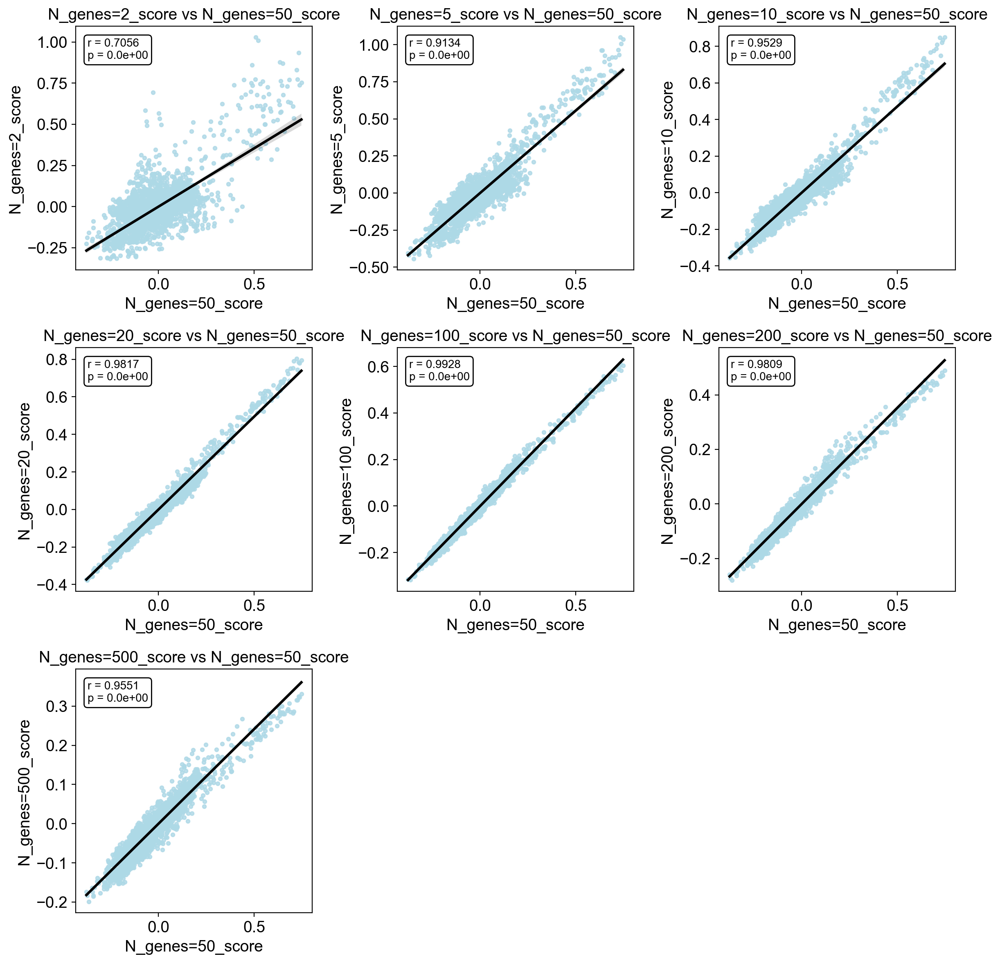

In [42]:
# List of gene score labels to compare with the reference
scores = ["2", "5", "10", "20", "100", "200", "500"]
x_label = "N_genes=50_score"

# Set up the figure with subplots
n_plots = len(scores)
n_cols = 3
n_rows = (n_plots + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 4))
axes = axes.flatten()

for i, score in enumerate(scores):
    y_label = f"N_genes={score}_score"
    df = adata.obs[[x_label, y_label]].dropna()

    corr, pval = pearsonr(df[x_label], df[y_label])

    ax = axes[i]
    sns.regplot(x=x_label, y=y_label, data=df,
                scatter_kws={"s": 10, "color": "lightblue"},
                line_kws={"color": "black"},
                ax=ax)

    ax.set_title(f"{y_label} vs {x_label}")
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.text(0.05, 0.95,
            f"r = {corr:.4f}\np = {pval:.1e}",
            transform=ax.transAxes,
            fontsize=10,
            verticalalignment="top",
            bbox=dict(facecolor="white", edgecolor="black", boxstyle="round,pad=0.3"))
    ax.grid(False)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig("brain_enrichmap_score_sensitivity_correlation.pdf", bbox_inches="tight")
plt.show()

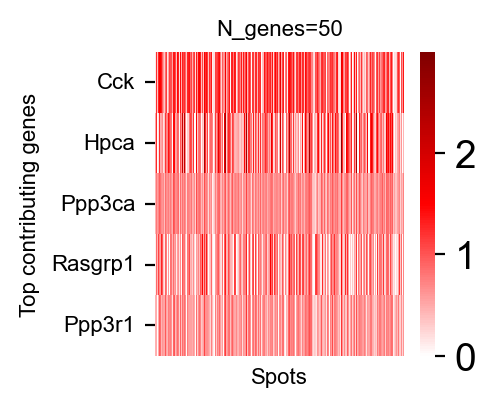

In [43]:
em.pl.gene_contributions_heatmap(
    adata,
    score_key="N_genes=50",
    top_n_genes=5,
    figsize=(2, 2),
    save="brain_enrichmap_score_sensitivity_gene_contributions.pdf",
)

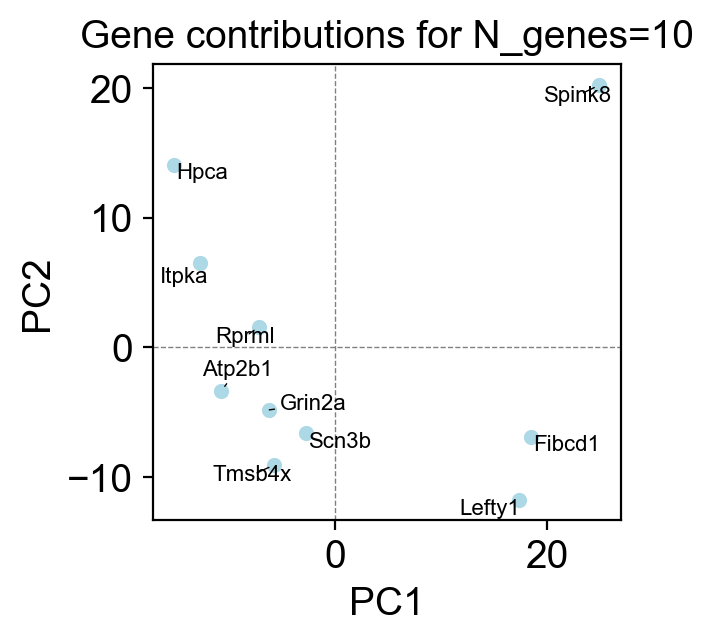

In [60]:
em.pl.gene_contributions_pca(
    adata,
    score_key="N_genes=10",
    top_n_genes=20,
    figsize=(3, 3),
    save="brain_enrichmap_score_sensitivity_gene_contributions_pca.pdf",
)

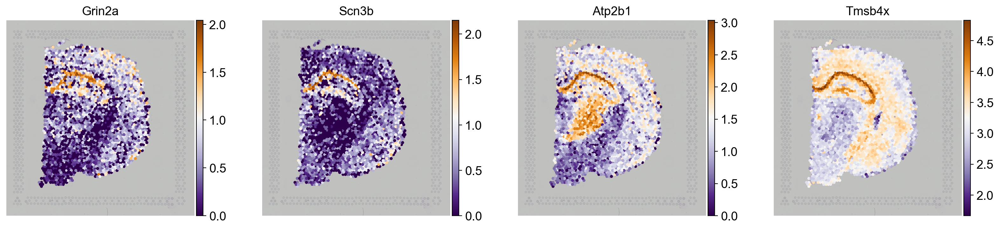

In [68]:
sq.pl.spatial_scatter(
    adata,
    color=["Grin2a", "Scn3b", "Atp2b1", "Tmsb4x"],
    size=2,
    use_raw=False,
    img_alpha=0.5,
    ncols=5,
    cmap="PuOr_r",
    save="brain_enrichmap_score_sensitivity_genes.pdf",
)

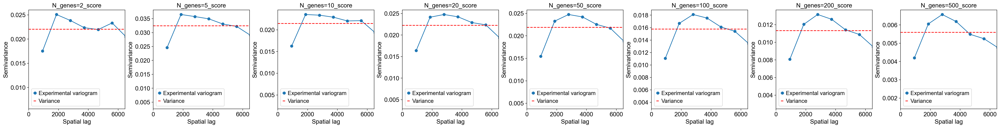

In [47]:
em.pl.variogram(
    adata,
    score_keys=score_keys,
    save="brain_enrichmap_score_sensitivity_variogram.pdf",
)

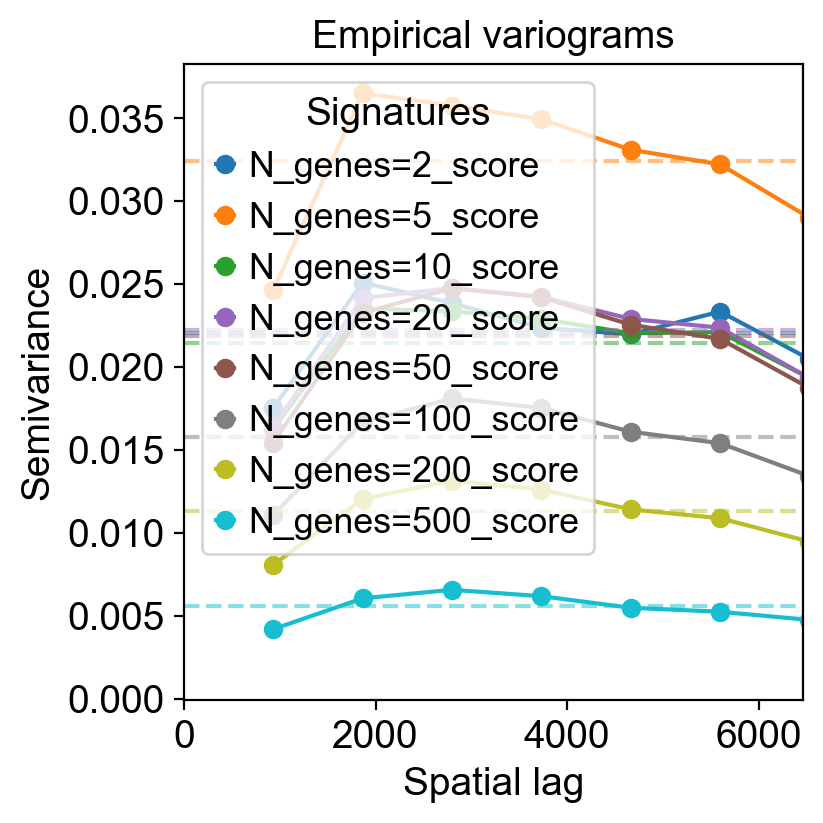

In [48]:
em.pl.variogram_all(
    adata,
    score_keys=score_keys,
    save="brain_enrichmap_score_sensitivity_variogram_all.pdf",
)

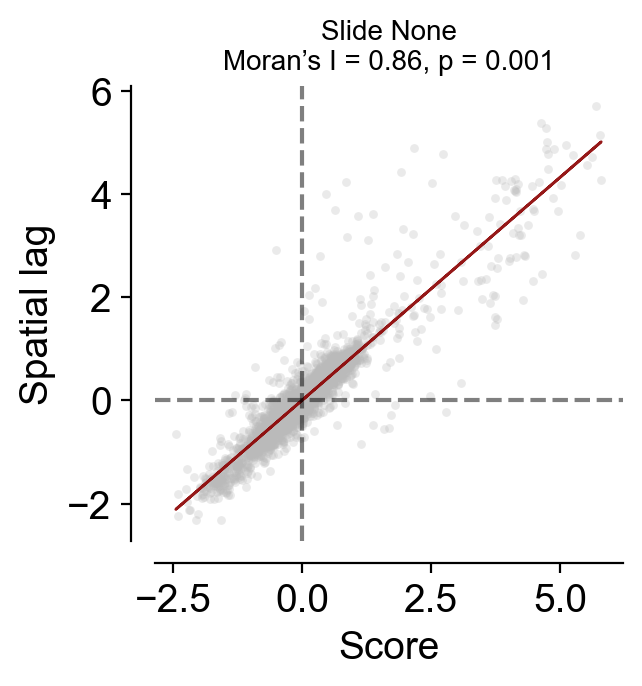

In [63]:
em.pl.morans_correlogram(
    adata,
    score_key="N_genes=10_score",
    save="brain_enrichmap_score_sensitivity_morans_correlogram.pdf",
)

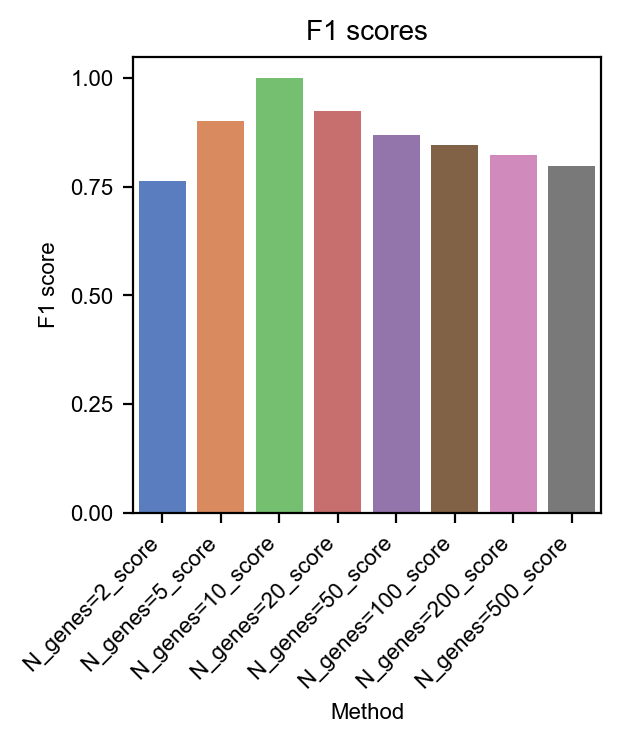

In [50]:
signature_name = "enrichmap"
binary_labels = em.tl.generate_binary_labels(adata, signature_name)
methods = [
    "N_genes=2_score",
    "N_genes=5_score",
    "N_genes=10_score",
    "N_genes=20_score",
    "N_genes=50_score",
    "N_genes=100_score",
    "N_genes=200_score",
    "N_genes=500_score"
]
f1_scores = em.tl.compute_f1_scores(adata, methods, binary_labels, save="brain_enrichmap_score_sensitivity_f1_scores.pdf")

In [15]:
signature_dict = {
    "Pyramidal_layer": gene_set_10,
    "Housekeeping": ["Gapdh", "Atp5f1", "Ubc", "Pgk1", "Tbp", "Rer1", "Hprt1", "Rpl27", "Rlp13a", "Sdha", "Actb", "B2m"],
    "Both": gene_set_10 + ["Gapdh", "Atp5f1", "Ubc", "Pgk1", "Tbp", "Rer1", "Hprt1", "Rpl27", "Rlp13a", "Sdha", "Actb", "B2m"]
}

In [16]:
em.tl.score(
    adata,
    gene_set=signature_dict,
    smoothing=True,
    correct_spatial_covariates=True,
    batch_key=None
)

Scoring signatures: 100%|██████████| 3/3 [00:03<00:00,  1.06s/it]


In [17]:
score_keys = ["Pyramidal_layer_score", "Housekeeping_score", "Both_score"]

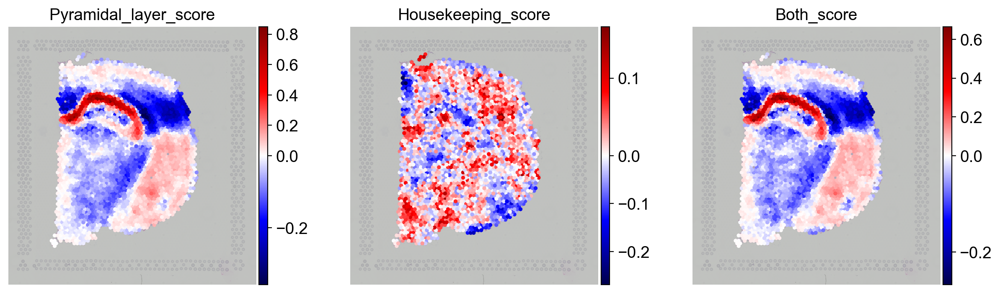

In [18]:
em.pl.spatial_enrichmap(
    adata,
    score_key=score_keys,
    size=2,
    ncols=3,
    save="brain_enrichmap_score_housekeeping.pdf",
)

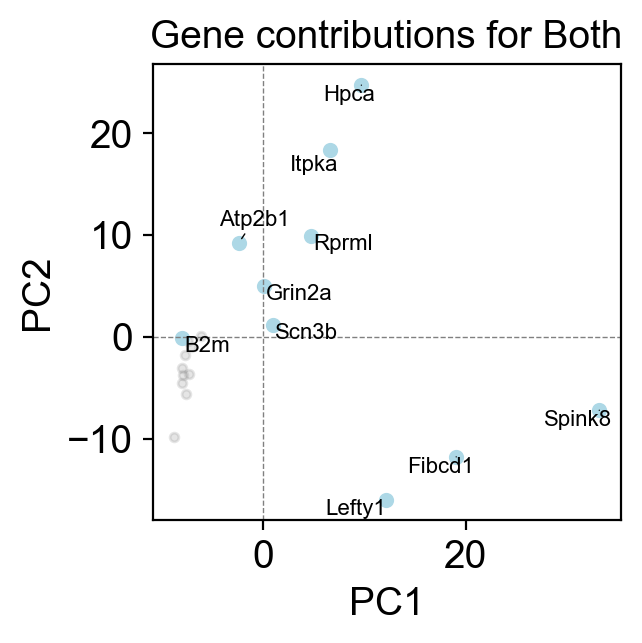

In [19]:
em.pl.gene_contributions_pca(
    adata,
    score_key="Both_score",
    top_n_genes=10,
    figsize=(3, 3),
    save="brain_enrichmap_score_housekeeping_gene_contributions_pca.pdf",
)

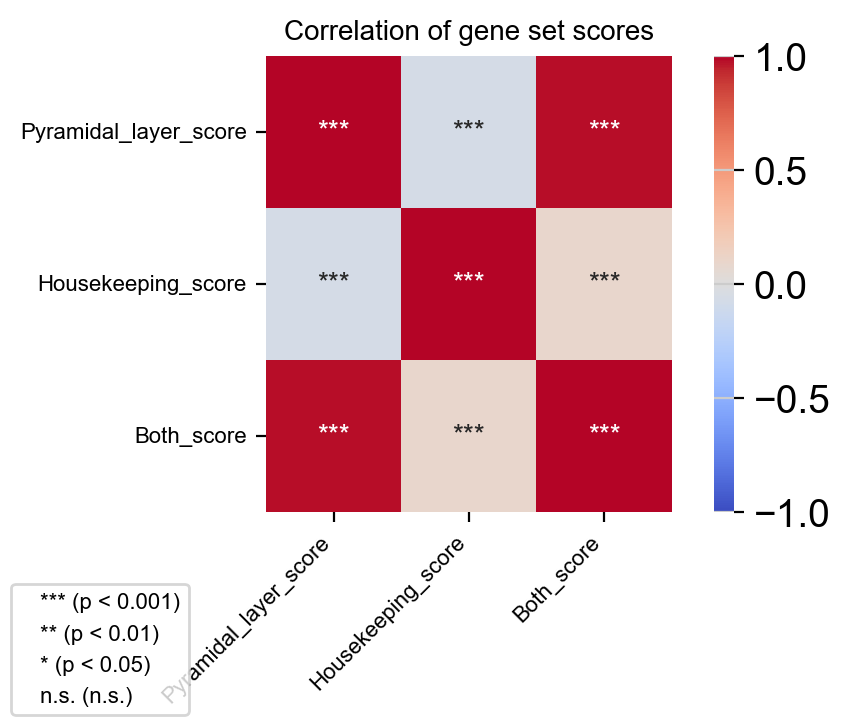

In [ ]:
em.pl.signature_correlation_heatmap(
    adata,
    score_keys=score_keys,
    figsize=(3,3),
    save="brain_enrichmap_score_housekeeping_signature_correlation.pdf",
)

Computing Moran's I for Pyramidal_layer_score with 6 neighbours...
Computing Moran's I for Housekeeping_score with 6 neighbours...
Computing Moran's I for Both_score with 6 neighbours...


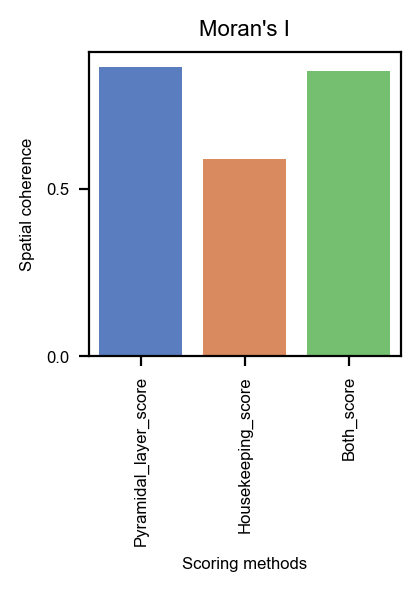

In [20]:
em.pl.spatial_metrics(
    adata,
    score_keys,
    metric="Moran's I",
    figsize=(2,2),
    save="brain_enrichmap_score_housekeeping_moransI.pdf",
)

Computing Geary's C for Pyramidal_layer_score with 6 neighbours...
Computing Geary's C for Housekeeping_score with 6 neighbours...
Computing Geary's C for Both_score with 6 neighbours...


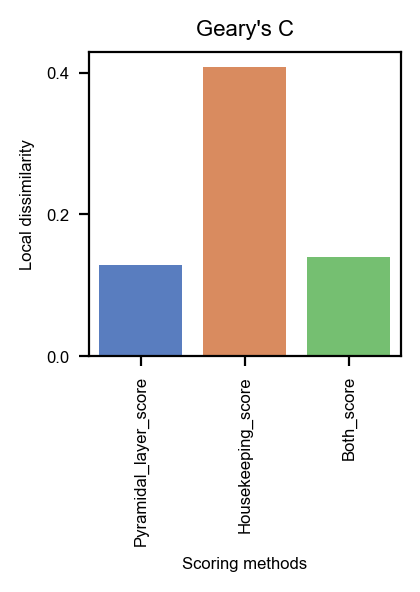

In [21]:
em.pl.spatial_metrics(
    adata,
    score_keys,
    metric="Geary's C",
    figsize=(2,2),
    save="brain_enrichmap_score_housekeeping_gearysC.pdf",
)